In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import seaborn as sns

pd.options.display.float_format = '{:,.2f}'.format


col_names = ['square_id', 'province', 'time_interval',
             'square_to_prov', 'prov_to_square']
mi_prov_file = pd.read_csv('all/milano/mi-to-provinces-2013-11-02.txt',
                           sep='\t', header=None, names=col_names)
mi_prov_file.head()

,square_id,province,time_interval,square_to_prov,prov_to_square
0,1,AGRIGENTO,1383384600000,nan,0.03
1,1,AGRIGENTO,1383423600000,nan,0.03
2,1,ALESSANDRIA,1383409200000,nan,0.03
3,1,ALESSANDRIA,1383412800000,nan,0.00
4,1,AREZZO,1383382200000,0.03,nan


# MI-Province data

## 1. Preparing data

Convert time

In [2]:
mi_prov_file['datetime'] = pd.to_datetime(mi_prov_file['time_interval'], unit='ms')
mi_prov_file.head()

,square_id,province,time_interval,square_to_prov,prov_to_square,datetime
0,1,AGRIGENTO,1383384600000,nan,0.03,2013-11-02 09:30:00
1,1,AGRIGENTO,1383423600000,nan,0.03,2013-11-02 20:20:00
2,1,ALESSANDRIA,1383409200000,nan,0.03,2013-11-02 16:20:00
3,1,ALESSANDRIA,1383412800000,nan,0.00,2013-11-02 17:20:00
4,1,AREZZO,1383382200000,0.03,nan,2013-11-02 08:50:00


Calculate the bidirection activity (can be used as proxy for connection strength) and the direction of the connection

In [3]:
mi_prov_file.fillna(0, inplace=True)

mi_prov_file['total_bidirection'] = (mi_prov_file['square_to_prov']
                                    + mi_prov_file['prov_to_square'])
mi_prov_file['net_outgoing'] = (mi_prov_file['square_to_prov']
                               - mi_prov_file['prov_to_square'])

mi_prov_file.head()

,square_id,province,time_interval,square_to_prov,prov_to_square,datetime,total_bidirection,net_outgoing
0,1,AGRIGENTO,1383384600000,0.00,0.03,2013-11-02 09:30:00,0.03,-0.03
1,1,AGRIGENTO,1383423600000,0.00,0.03,2013-11-02 20:20:00,0.03,-0.03
2,1,ALESSANDRIA,1383409200000,0.00,0.03,2013-11-02 16:20:00,0.03,-0.03
3,1,ALESSANDRIA,1383412800000,0.00,0.00,2013-11-02 17:20:00,0.00,-0.00
4,1,AREZZO,1383382200000,0.03,0.00,2013-11-02 08:50:00,0.03,0.03


In [4]:
mi_prov_act = mi_prov_file.groupby('square_id').sum()

mi_prov_act.head()

,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
square_id,,,,,
1,496640451000000,17.82,16.83,34.65,0.98
2,496640451000000,18.07,17.12,35.19,0.95
3,438537832800000,18.34,17.43,35.77,0.91
4,496640451000000,17.09,16.00,33.09,1.09
5,521541435000000,15.96,15.05,31.02,0.91


In [5]:
mi_prov_act['net_outgoing_%'] = (mi_prov_act['net_outgoing'] 
                                 / mi_prov_act['total_bidirection'] * 100)

mi_prov_act.describe()

,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
count,"10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00"
mean,"542,872,847,584,679.50",99.79,101.14,200.93,-1.35,-0.72
std,"230,703,067,811,149.41",141.77,144.35,284.74,28.24,10.87
min,"40,118,632,200,000.00",0.00,0.46,0.98,-690.57,-100.00
25%,"373,518,074,400,000.00",19.05,20.17,39.44,-2.50,-3.00
50%,"507,707,494,200,000.00",50.81,51.83,102.75,0.37,0.67
75%,"670,949,089,650,000.00",117.09,118.56,234.84,4.22,4.34
max,"2,358,696,045,600,000.00","2,583.32","3,042.79","5,582.18",341.94,41.46


Prepare the coordinate for each square id

In [6]:
col = [(id_ % 100) if (id_ % 100) !=0 else 100 for id_ in range(1, 10001)]
row = [((id_ - col_) / 100 + 1) for id_, col_ in zip(range(1, 10001), col)]

squares_loc = pd.DataFrame()
squares_loc['square_id'] = list(range(1, 10001))
squares_loc['col'] = col
squares_loc['row'] = row

mi_prov_act = mi_prov_act.merge(squares_loc, on='square_id')
display (mi_prov_act.head())

,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%,col,row
0,1,496640451000000,17.82,16.83,34.65,0.98,2.84,1,1.00
1,2,496640451000000,18.07,17.12,35.19,0.95,2.69,2,1.00
2,3,438537832800000,18.34,17.43,35.77,0.91,2.54,3,1.00
3,4,496640451000000,17.09,16.00,33.09,1.09,3.30,4,1.00
4,5,521541435000000,15.96,15.05,31.02,0.91,2.93,5,1.00


In [7]:
col = mi_prov_act.columns.drop(['square_id', 'time_interval', 'col', 'row'])

print (col)

Index(['square_to_prov', 'prov_to_square', 'total_bidirection', 'net_outgoing',
       'net_outgoing_%'],
      dtype='object')


## 2. Distribution of variables

Plot the distribution of the variables

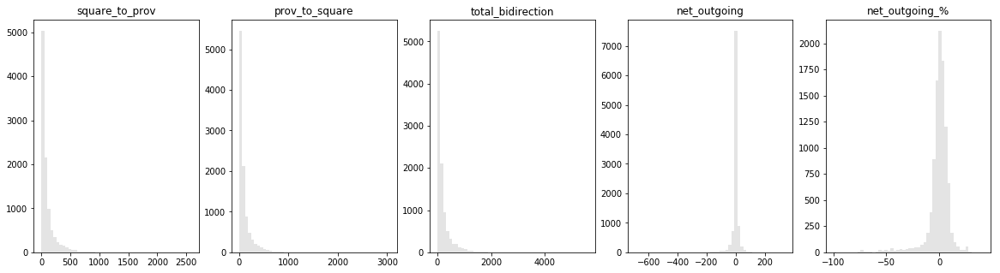

In [8]:
fig, ax = plt.subplots(ncols=5, figsize=(20, 5))

for i, c in enumerate(col):
    ax[i].hist(mi_prov_act[c], 50, 
               facecolor='lightgrey', alpha=0.6)
    ax[i].set_title(c)
        
plt.show()

Apply cube root to reduce skewness. However, this result in a bimodal distribution for net_outgoing_% (strength of direction)

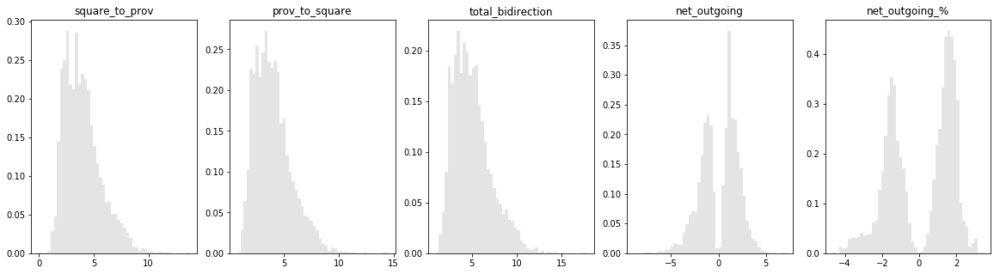

In [9]:
fig, ax = plt.subplots(ncols=5, figsize=(20, 5))

for i, c in enumerate(col):
    ax[i].hist(np.cbrt(mi_prov_act[c]), 50, density=True, 
               facecolor='lightgrey', alpha=0.6)
    ax[i].set_title(c)
#     ax[i].set_xscale('log')
        
plt.show()

Map the data of each square to the coordinate, with the size indicating total activity, while the color indicate direction (red = more incoming). Because the net % as calculated above show high skew towards the negative direction, a symmetric log normal is used to ensure that incoming remain on the red side. This has the effect of making color on 2 side of the scale non-comparable (blue cannot be compared to red, but blue vs blue is OK)

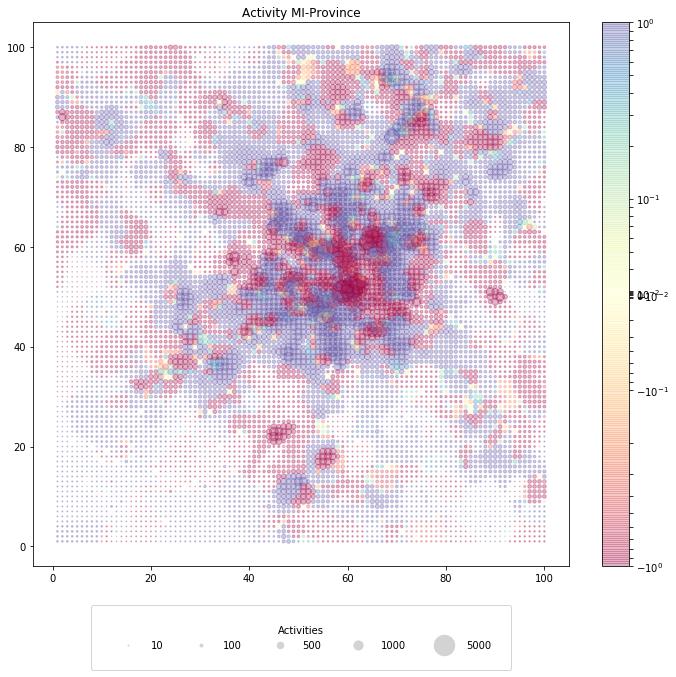

In [10]:
def plot_square_coor(df, s_col, c_col, title):
    """
    Plot the square on a 100x100 board to visualize activity
    """
#     n_min = df[c_col].quantile(0.2)
#     n_max = df[c_col].quantile(0.8)
    plot = plt.scatter(x=df['col'], y=df['row'], 
                       s=df[s_col]/12, c=df[c_col], 
                       norm=colors.SymLogNorm(linthresh=0.03, linscale=0.03, 
                                              vmin=-1, vmax=1), 
                       cmap='Spectral', alpha=0.3)    
    plt.title(title)
    plt.colorbar(plot)
    legend_label = [10, 100, 500, 1000, 5000]
    legend_box = [plt.scatter([], [], s=i/12, c='lightgrey') for i in legend_label]
    plt.legend(legend_box, legend_label, bbox_to_anchor=(0.5, -0.2), 
               ncol=5, handlelength=3.5, loc=8, borderpad=2, 
               handletextpad=0.5, title='Activities')

fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_prov_act, 
                 'total_bidirection', 'net_outgoing_%',
                 'Activity MI-Province')
plt.show()

The map show that there are 4-5 heavy 'receiver' areas (more incoming) and 1-2 heavy 'sender' area. Out of the 'receivers': city center, shopping district and the airport

Method for classifying a square_id purpose: using attributes or the difference between some attributes of a square id vs its neighbour

Attributes to consider: activity direction, activity scale, distance to the center, difference in top contacts, difference in quality of top contacts

In [11]:
def top_contact_prov(id_list, mi_prov_df, var):
    """
    Identify the top province in the contact, ranking 
    by variable ('total_bidirection' or 'net_outgoing')
    """
    is_in_idlist = mi_prov_df['square_id'].isin(id_list)
    top = mi_prov_df.groupby('province').sum()    
    if 'net_' in var:
        top['net_outgoing_%'] = (top['net_outgoing']
                                 / top['total_bidirection'] * 100)
        result = top.sort_values('net_outgoing_%', ascending=True)
    else:
        result = top.sort_values('total_bidirection', ascending=False)
    return result

id_list = mi_prov_file['square_id'].unique()
display (top_contact_prov(id_list, mi_prov_file, 
                          'total_bidirection').head())
display (top_contact_prov(id_list, mi_prov_file, 
                          'net_outgoing').head())

,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,5384961175,1485411589476324352,"735,083.77","738,863.73","1,473,947.50","-3,779.96"
MONZA E DELLA BRIANZA,1697850555,356886565905000000,"38,868.97","40,608.66","79,477.63","-1,739.69"
PAVIA,811705952,313209921235200000,"16,440.08","18,840.25","35,280.34","-2,400.17"
NAPOLI,690463320,185063218239000000,"13,936.15","13,276.47","27,212.62",659.69
BERGAMO,761392590,188266766140200000,"11,702.88","12,326.81","24,029.69",-623.93


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
ASTI,29945896,8736188724600000,307.30,674.00,981.30,-366.70,-37.37
ALESSANDRIA,81696158,24627281343600000,"1,143.82","1,901.03","3,044.85",-757.21,-24.87
GORIZIA,11489393,2936963917200000,179.79,270.91,450.70,-91.12,-20.22
ORISTANO,9135084,2386369428600000,116.13,170.74,286.87,-54.61,-19.04
PRATO,26430810,7640521644000000,468.90,630.78,"1,099.68",-161.88,-14.72


Checking top contacts based on both direction as well as only the outgoing direction give different pictures: most activity by far and large is internal (within Milan province and Lombardy area). Outgoing activity are more likely to go outside Lombardy.

In [12]:
median_square_activity = mi_prov_act.loc[:, 'total_bidirection'].median()

print (median_square_activity)

102.74792242823891


Split the squares into quantile based on their activity to the province to see if there's any difference

In [13]:
act_lvl_name = ['low_act', 'mild_act', 'hi_act', 'center']

def quant_div(df, var):
    """
    Split the activity level into quantile
    """
    no, lo, mi, hi, to = (df.loc[:, var].quantile([0, 0.25, 0.5, 0.75, 1]))
    qr = list([no, lo, mi, hi, to])
    for i in range(0, 4):
        is_in_quant = ((df.loc[:, var] >= qr[i]) 
                       & (df.loc[:, var] < qr[i+1]))
        df.loc[is_in_quant, 'act_group'] = act_lvl_name[i]
    return df

mi_prov_act = quant_div(mi_prov_act, 'total_bidirection')

mi_prov_grp = {}
for grp in act_lvl_name:
    is_in_grp = mi_prov_act['act_group'] == grp
    activity_ids = (mi_prov_file.loc[:, 'square_id']
                                .isin(mi_prov_act.loc[is_in_grp, 'square_id'])
                   )
    mi_prov_grp[grp] = mi_prov_file.loc[activity_ids]

# for grp in act_lvl_name:
#     display (top_contact_prov(mi_prov_grp[grp], 'total_bidirection').head())

# MI-MI data

## 1. Preparing data

In [64]:
col_names = ['time_interval', 'from_sq_id', 'to_sq_id', 'strength']
mi_mi_file = pd.read_csv('all/milano/MItoMI-2013-11-02.txt', 
                         sep='\t', header=None, names=col_names)

mi_mi_file['datetime'] = pd.to_datetime(mi_mi_file['time_interval'], unit='ms')
mi_mi_file.head()

,time_interval,from_sq_id,to_sq_id,strength,datetime
0,1383348600000,1,1,0.00,2013-11-01 23:30:00
1,1383373800000,1,1,0.00,2013-11-02 06:30:00
2,1383375600000,1,1,0.00,2013-11-02 07:00:00
3,1383382200000,1,1,0.00,2013-11-02 08:50:00
4,1383384600000,1,1,0.00,2013-11-02 09:30:00


___

# MI Total

In [14]:
col_names = ['square_id', 'time_interval', 'country_code',
             'sms_in', 'sms_out', 'call_in', 'call_out', 'internet_traffic']

mi_file = pd.read_csv('all/milano/sms-call-internet-mi-2013-11-02.txt',
                      sep='\t', header=None, names=col_names)
mi_file.head()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic
0,1,1383346800000,0,0.03,nan,nan,nan,nan
1,1,1383346800000,39,0.27,0.11,0.00,0.08,7.84
2,1,1383347400000,0,0.11,nan,nan,nan,nan
3,1,1383347400000,39,0.16,0.14,0.05,0.08,8.62
4,1,1383347400000,53,nan,0.00,nan,nan,nan


In [15]:
mi_file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4745086 entries, 0 to 4745085
Data columns (total 8 columns):
square_id           int64
time_interval       int64
country_code        int64
sms_in              float64
sms_out             float64
call_in             float64
call_out            float64
internet_traffic    float64
dtypes: float64(5), int64(3)
memory usage: 289.6 MB


Adding some calculations

In [16]:
mi_file['datetime'] = pd.to_datetime(mi_file['time_interval'], unit='ms')
mi_file.fillna(0, inplace=True)

mi_file['total_bidirection_sms'] = mi_file['sms_in'] + mi_file['sms_out']
mi_file['total_bidirection_call'] = mi_file['call_in'] + mi_file['call_out']
mi_file['activity_in'] = mi_file['sms_in'] + mi_file['call_in']
mi_file['activity_out'] = mi_file['sms_out'] + mi_file['call_out']
mi_file['net_outgoing_call'] = mi_file['call_out'] - mi_file['call_in']
mi_file['net_outgoing_sms'] = mi_file['sms_out'] - mi_file['sms_in']
mi_file['net_out_call_sms'] = mi_file['activity_out'] - mi_file['activity_in']
mi_file['total_call_sms'] = (mi_file['sms_in'] + mi_file['sms_out'] 
                             + mi_file['call_in'] + mi_file['call_out'])

mi_file.head()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,datetime,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
0,1,1383346800000,0,0.03,0.00,0.00,0.00,0.00,2013-11-01 23:00:00,0.03,0.00,0.03,0.00,0.00,-0.03,-0.03,0.03
1,1,1383346800000,39,0.27,0.11,0.00,0.08,7.84,2013-11-01 23:00:00,0.39,0.08,0.28,0.19,0.08,-0.16,-0.08,0.47
2,1,1383347400000,0,0.11,0.00,0.00,0.00,0.00,2013-11-01 23:10:00,0.11,0.00,0.11,0.00,0.00,-0.11,-0.11,0.11
3,1,1383347400000,39,0.16,0.14,0.05,0.08,8.62,2013-11-01 23:10:00,0.30,0.14,0.21,0.22,0.03,-0.03,0.01,0.43
4,1,1383347400000,53,0.00,0.00,0.00,0.00,0.00,2013-11-01 23:10:00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


___

## 1. Overview

As we have seen, the data is call records (CDRs) aggregating to the level of square id, for every 10 minute interval. The number is proportional to and can likely be thought of as amount of call/text/internet activity

Before performing analysis we may want to construct a framework to understand the data and guide the analysis process

The number of call/text/internet per square represent the demand for communication in that square, and is a function of:
- 1.Number of people
- 2.The average size of their networks
- 3.Their base demand for communication
- 4.The base demand for comminication of their networks
- 5.Location/Type of location
- 6.Time

(2) is related to and is a measure of how economically or socially active the person is. It may also depend on the culture of the area

(1) is related to many things, including the attractiveness of the area (measured in terms of access to basic necessity), house price mix vs income mix. It is also related to the flow of people (for example, a traffic jam will increase density in the area). It can therefore impact (2)

(1) and (2) can be used as a proxy for economic activity but it can also be a proxy for the connectedness of the area (both more economically active people and more connected people mean there are more need to communicate). In this case, finding where/when the area is most connected can help us determine the true affluence level of the square

(5) and (6) are related to (3) and (4), mainly in the purpose of making call. A call from home, outside of work hour is more likely to be a desire for socializing. (5) and (6) are related to (1) in the sense that it influences a square's flow

The separation of inbound/outbound allow us to determine the direction of activity. This direction is a function of (3) and (4) but not (1) or (2). Furthermore, a person may rarely initiate call, but he/she will almost always accept incoming call. We therefore hypothesize that outbound is constraint on time/energy level (6), while inbound is not

The distinction between call/text/internet is also quite important: most studies show that young people generally use more text/internet rather than call

Finally, we have additional data in the form of country code. The people who use a different country code from EU number are most likely non-residents (tourists, newly-arrived immigrants...). In contrast with residents they will cluster near hotel, shop, sightseeing places and transit hubs. This is an easy route to identify the purpose of the squares, which are linked to (1), (2) and (3) from which we can use to identify the behaviour of residents

___

## 2. Cleaning & Preparing data

First, check for irregularities (call center/automated SMS)

In [17]:
mi_file.sort_values('net_outgoing_call').head(10)

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,datetime,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
3818607,8169,1383410400000,39,36.84,25.52,83.37,38.62,"1,283.48",2013-11-02 16:40:00,62.36,121.99,120.21,64.14,-44.75,-11.32,-56.07,184.36
2079251,5161,1383408000000,39,185.50,84.08,190.99,147.94,"5,047.82",2013-11-02 16:00:00,269.58,338.94,376.50,232.02,-43.05,-101.43,-144.48,608.52
2078416,5161,1383391200000,39,117.59,86.86,137.37,96.03,"3,720.37",2013-11-02 11:20:00,204.45,233.40,254.96,182.89,-41.33,-30.73,-72.06,437.85
2012978,5061,1383406800000,39,67.44,40.35,94.37,53.47,"1,861.78",2013-11-02 15:40:00,107.79,147.84,161.82,93.81,-40.91,-27.10,-68.00,255.63
1676290,4464,1383355800000,39,0.69,1.09,44.29,5.68,110.27,2013-11-02 01:30:00,1.77,49.97,44.97,6.77,-38.60,0.40,-38.20,51.74
2517722,5862,1383391200000,39,13.59,7.70,46.05,7.51,304.92,2013-11-02 11:20:00,21.29,53.57,59.64,15.22,-38.54,-5.89,-44.43,74.86
1676286,4464,1383355200000,39,3.14,1.13,41.32,2.79,103.76,2013-11-02 01:20:00,4.27,44.12,44.46,3.93,-38.53,-2.00,-40.53,48.39
2716481,6169,1383409200000,39,63.79,30.12,76.34,38.36,835.25,2013-11-02 16:20:00,93.91,114.71,140.14,68.48,-37.98,-33.67,-71.66,208.62
1887772,4853,1383384600000,39,61.29,20.04,73.31,37.08,482.42,2013-11-02 09:30:00,81.33,110.38,134.59,57.12,-36.23,-41.24,-77.47,191.71
2658510,6073,1383387000000,39,32.91,25.48,80.47,44.93,"1,094.01",2013-11-02 10:10:00,58.39,125.40,113.38,70.41,-35.53,-7.44,-42.97,183.78


In [18]:
mi_file.sort_values('net_outgoing_sms').head(10)

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,datetime,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
2571013,5951,1383379200000,0,272.22,0.00,0.00,0.00,0.00,2013-11-02 08:00:00,272.22,0.00,272.22,0.00,0.00,-272.22,-272.22,272.22
2584747,5965,1383379800000,0,259.62,45.96,0.00,0.57,0.00,2013-11-02 08:10:00,305.58,0.57,259.62,46.54,0.57,-213.66,-213.09,306.16
2079057,5161,1383404400000,0,201.45,2.03,2.70,1.22,0.00,2013-11-02 15:00:00,203.48,3.92,204.15,3.25,-1.48,-199.43,-200.91,207.40
2078964,5161,1383402600000,0,178.37,0.00,0.00,4.89,0.00,2013-11-02 14:30:00,178.37,4.89,178.37,4.89,4.89,-178.37,-173.47,183.26
2008915,5059,1383408600000,39,247.65,70.46,175.15,182.68,"2,422.65",2013-11-02 16:10:00,318.12,357.83,422.80,253.14,7.53,-177.19,-169.66,675.94
2078690,5161,1383397200000,0,175.70,0.00,0.00,0.09,0.00,2013-11-02 13:00:00,175.70,0.09,175.70,0.09,0.09,-175.70,-175.62,175.79
2079418,5161,1383411600000,0,189.85,15.71,0.00,0.00,0.00,2013-11-02 17:00:00,205.55,0.00,189.85,15.71,0.00,-174.14,-174.14,205.56
2079391,5161,1383411000000,0,181.81,10.60,5.14,5.31,0.00,2013-11-02 16:50:00,192.41,10.45,186.95,15.91,0.16,-171.21,-171.04,202.86
2008552,5059,1383400200000,0,165.04,0.75,0.00,6.46,0.00,2013-11-02 13:50:00,165.78,6.46,165.04,7.21,6.46,-164.29,-157.83,172.24
2008662,5059,1383402600000,0,164.68,2.75,2.40,2.75,0.00,2013-11-02 14:30:00,167.43,5.15,167.08,5.50,0.35,-161.93,-161.58,172.58


In [19]:
mi_file.loc[:, 'country_code'].value_counts().head(10)

39     1439983
0      1117152
33      216027
46      206258
20      159077
49      153201
41      145609
44      111455
40       95092
380      88963
Name: country_code, dtype: int64

Knowing the information about immigrants we are interested in seeing if second-wave immigrants (external) show any difference vs first-wave (internal). Since we have country code we can identify each country separately.

In [20]:
mi_file.loc[:, 'first_digit'] = mi_file.loc[:, 'country_code'].apply(lambda x: str(x)[0])

first_digit = ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
country = ['Unknown', 'NA', 'AF', 'EU', 'EU', 'SA', 'AP', 'RU', 'EA', 'ME']

for dgt, ctry in zip(first_digit, country):
        mi_file.loc[mi_file['first_digit'] == dgt, 'country'] = ctry

display (mi_file.groupby('country')['total_call_sms'].sum())

country
AF            74,544.79
AP            17,423.64
EA            38,593.89
EU        11,757,233.70
ME            25,209.16
NA            14,638.78
RU            21,385.09
SA            15,776.16
Unknown    1,839,797.07
Name: total_call_sms, dtype: float64

Most records (call & sms) are from EU numbers but Africa and East Asia also feature in the top. We can map the country in each square id to their respective coordinate

In [21]:
def net_pc_calc(df):
    df['net_out_%'] = (df['net_out_call_sms'] 
                       / df['total_call_sms'] * 100)
    df['net_outcall_%'] = (df['net_outgoing_call'] 
                           / df['total_bidirection_call'] * 100)
    df['net_outsms_%'] = (df['net_outgoing_sms'] 
                          / df['total_bidirection_sms'] * 100)
    return df

def map_to_square(df, var, var_list):
    """
    Create a dict of dataframe, each dataframe is a slice 
    of df that are mapped on to square coordinate. Additional 
    calculation are for the net % out to indicate 
    activity direction
    """
    map_ = {}
    main_var = var[0]
    var.insert(0, 'square_id')
    mi_map = df.groupby(var).sum().reset_index()
    for v in var_list:
        map_[v] = mi_map.loc[mi_map[main_var]==v]
        if 'col' not in mi_map.columns:
            map_[v] = map_[v].merge(squares_loc, on='square_id')
        map_[v] = net_pc_calc(map_[v])
    return map_, mi_map

In [22]:
ctr_map, mi_by_country = map_to_square(mi_file, ['country'], country)

display (mi_by_country.groupby('country').sum()
                      .sort_values('total_bidirection_call', 
                                   ascending=False)
                      .loc[:, ['call_in', 'call_out']])

display (mi_by_country.groupby('country').sum()
                      .sort_values('total_bidirection_sms', 
                                   ascending=False)
                      .loc[:, ['sms_in', 'sms_out']])

display (mi_by_country.groupby('country').sum()
                      .sort_values('internet_traffic', 
                                   ascending=False)
                      .loc[:, ['internet_traffic']])

,call_in,call_out
country,,
EU,"2,805,590.37","3,228,036.25"
Unknown,"8,978.98","74,954.51"
AF,"5,771.30","53,258.98"
EA,"2,476.47","25,761.67"
ME,"4,526.93","10,647.26"
SA,"2,085.38","9,057.24"
AP,594.80,"7,944.68"
RU,"3,930.08","1,795.66"
NA,"1,644.35","1,624.05"


,sms_in,sms_out
country,,
EU,"3,057,047.32","2,666,559.76"
Unknown,"1,636,243.86","119,619.72"
RU,"8,670.63","6,988.71"
AF,"13,281.15","2,233.35"
NA,"9,055.60","2,314.78"
EA,"7,655.18","2,700.58"
ME,"7,633.47","2,401.49"
AP,"7,415.39","1,468.78"
SA,"3,037.18","1,596.36"


,internet_traffic
country,
EU,"80,942,836.30"
NA,"14,934.78"
ME,"8,670.68"
EA,"8,545.96"
RU,"8,188.22"
SA,"4,374.76"
AP,"2,501.58"
AF,948.67
Unknown,15.71


Apparently, East Asian is heavy-caller, African also call out and receive text a lot but do not use Internet much, Russian text a lot but rarely call, and North American prefer to use Internet. Unknown is text-heavy receiver with nearly no Internet traffic

___

## 3. A quick look at country

We will try to identify the difference between resident/non-resident as well as difference within the non-resident community

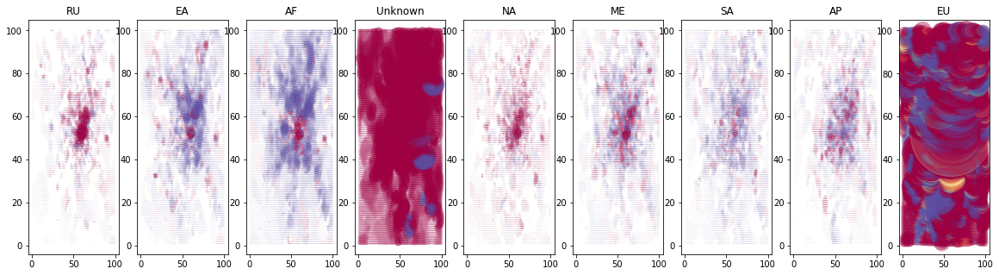

In [23]:
country_u = list(set(country))

def plot_map(data, s_col, c_col, var_list, adj_s=4):
    """
    Plot multiple slices of the data for each variable in 
    var_list onto a square coordinate
    """
    for i, var in enumerate(var_list):
#         n_min = df[var][c_col].quantile(0.25)
#         n_max = df[var][c_col].quantile(0.75)
        ax[i].scatter(x=data[var]['col'], y=data[var]['row'], 
                      s=data[var][s_col]/adj_s, c=data[var][c_col], 
                      norm=colors.SymLogNorm(linthresh=0.03, linscale=0.03, 
                                             vmin=-1, vmax=1), 
                      cmap='Spectral', alpha=0.2)
        ax[i].set_title(var)
        
fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map(ctr_map, 'total_call_sms', 'net_out_%', country_u)
plt.show()

(insert spatial dispersion)

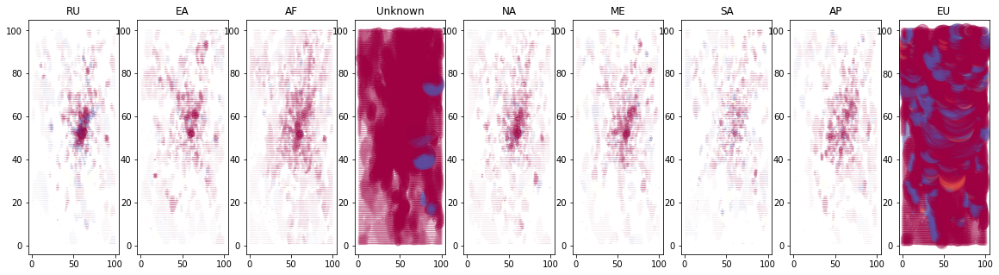

In [24]:
fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map(ctr_map, 'total_bidirection_sms', 'net_outsms_%', country_u)
plt.show()

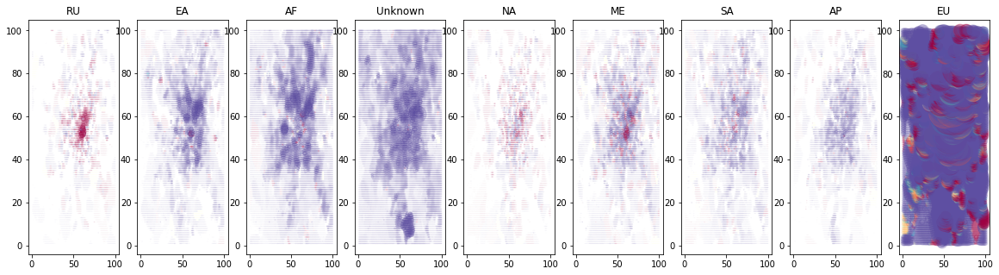

In [25]:
fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map(ctr_map, 'total_bidirection_call', 'net_outcall_%', country_u)
plt.show()

Non-resident (esp. Africa and East Asia) is more likely to call outside of the center and receive sms when in the center

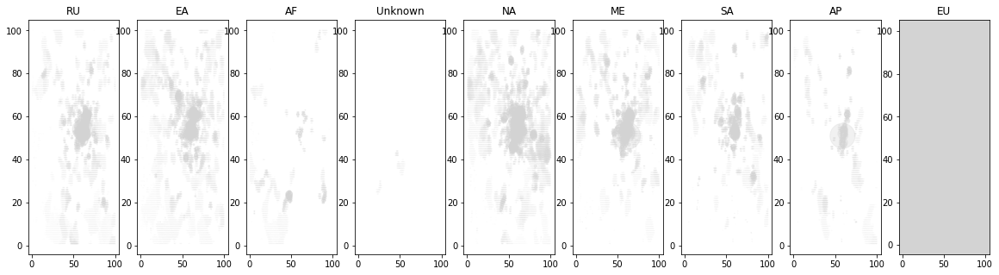

In [26]:
def plot_map_internet(df, var_list, s_adj=1):
    for i, var in enumerate(var_list):
        ax[i].scatter(x=df[var]['col'], y=df[var]['row'], 
                      s=df[var]['internet_traffic']/s_adj, 
                      c='lightgrey', alpha=0.3)
        ax[i].set_title(var)

fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
plot_map_internet(ctr_map, country_u)
plt.show()

Unlike call and text, Internet use for non-resident are less spread out, concentrating in the city center and directly above the center. This is a potential indicator of income - people that come from countries that have data roaming with Italy operator are more likely to be high earner (i.e North America, Middle East and East Asia)

___

## 4. Summary of the data

In [27]:
mi_total_act = mi_file.groupby('square_id').sum()

mi_total_act.head()

,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms
square_id,,,,,,,,,,,,,,,
1,455136389400000,17666,86.42,43.88,47.89,53.59,"1,515.64",130.29,101.48,134.31,97.47,5.70,-42.54,-36.84,231.77
2,455136389400000,17666,87.74,44.51,48.64,54.52,"1,522.73",132.25,103.16,136.37,99.03,5.89,-43.23,-37.34,235.41
3,428852099400000,15340,89.15,45.19,49.43,55.51,"1,530.27",134.34,104.94,138.58,100.70,6.08,-43.96,-37.87,239.28
4,455136389400000,17666,82.58,42.03,45.73,50.89,"1,495.12",124.62,96.63,128.32,92.93,5.16,-40.55,-35.39,221.24
5,456519822000000,17700,77.04,39.31,42.70,47.57,"1,363.15",116.35,90.27,119.74,86.88,4.87,-37.73,-32.86,206.62


In [28]:
def net_calc(df):  
    df['net_outcall_%'] = (df['net_outgoing_call'] 
                           / df['total_bidirection_call'] * 100)
    df['net_outsms_%'] = (df['net_outgoing_sms'] 
                          / df['total_bidirection_sms'] * 100)
    df['net_out_%'] = (df['net_out_call_sms'] 
                       / df['total_call_sms'] * 100)
    df = df.merge(squares_loc, on='square_id')
    return df

mi_total_act = net_calc(mi_total_act)
mi_total_act.head()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,...,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,net_outcall_%,net_outsms_%,net_out_%,col,row
0,1,455136389400000,17666,86.42,43.88,47.89,53.59,"1,515.64",130.29,101.48,...,97.47,5.70,-42.54,-36.84,231.77,5.62,-32.65,-15.89,1,1.00
1,2,455136389400000,17666,87.74,44.51,48.64,54.52,"1,522.73",132.25,103.16,...,99.03,5.89,-43.23,-37.34,235.41,5.71,-32.69,-15.86,2,1.00
2,3,428852099400000,15340,89.15,45.19,49.43,55.51,"1,530.27",134.34,104.94,...,100.70,6.08,-43.96,-37.87,239.28,5.80,-32.72,-15.83,3,1.00
3,4,455136389400000,17666,82.58,42.03,45.73,50.89,"1,495.12",124.62,96.63,...,92.93,5.16,-40.55,-35.39,221.24,5.34,-32.54,-16.00,4,1.00
4,5,456519822000000,17700,77.04,39.31,42.70,47.57,"1,363.15",116.35,90.27,...,86.88,4.87,-37.73,-32.86,206.62,5.39,-32.43,-15.90,5,1.00


In [29]:
mi_total_act.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10000 entries, 0 to 9999
Data columns (total 21 columns):
square_id                 10000 non-null int64
time_interval             10000 non-null int64
country_code              10000 non-null int64
sms_in                    10000 non-null float64
sms_out                   10000 non-null float64
call_in                   10000 non-null float64
call_out                  10000 non-null float64
internet_traffic          10000 non-null float64
total_bidirection_sms     10000 non-null float64
total_bidirection_call    10000 non-null float64
activity_in               10000 non-null float64
activity_out              10000 non-null float64
net_outgoing_call         10000 non-null float64
net_outgoing_sms          10000 non-null float64
net_out_call_sms          10000 non-null float64
total_call_sms            10000 non-null float64
net_outcall_%             10000 non-null float64
net_outsms_%              9998 non-null float64
net_out_%        

In [30]:
mi_total_act.loc[mi_total_act['net_outsms_%'].isnull()]

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,...,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,net_outcall_%,net_outsms_%,net_out_%,col,row
5238,5239,329247882000000,14504,0.00,0.00,0.00,515.48,19.44,0.00,515.48,...,515.48,515.48,0.00,515.48,515.48,100.00,nan,100.00,39,53.00
5338,5339,466204297200000,25773,0.00,0.00,0.00,540.94,46.44,0.00,540.94,...,540.94,540.94,0.00,540.94,540.94,100.00,nan,100.00,39,54.00


In [31]:
mi_total_act['net_outsms_%'].fillna(0, inplace=True)

mi_total_act.describe()

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,...,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,net_outcall_%,net_outsms_%,net_out_%,col,row
count,"10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00",...,"10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00","10,000.00"
mean,"5,000.50","656,432,639,771,154.12","93,402.40",475.00,280.59,283.56,341.31,"8,099.10",755.59,624.87,...,621.90,57.75,-194.42,-136.67,"1,380.46",8.43,-26.25,-9.46,50.50,50.50
std,"2,886.90","246,187,239,877,598.72","114,171.04",753.37,445.52,417.53,500.36,"12,250.74","1,159.36",913.15,...,906.26,124.76,433.55,387.34,"2,050.34",10.30,16.75,11.91,28.87,28.87
min,1.00,"251,777,289,600,000.00","5,719.00",0.00,0.00,0.00,1.44,19.44,0.00,2.72,...,2.43,-410.21,"-12,403.56","-11,538.52",5.70,-20.16,-85.79,-67.41,1.00,1.00
25%,"2,500.75","502,171,944,000,000.00","21,831.50",88.87,52.67,52.63,64.46,"1,659.51",146.29,118.43,...,126.38,4.99,-232.76,-179.05,268.87,3.44,-35.91,-15.74,25.75,25.75
50%,"5,000.50","601,776,781,800,000.00","44,317.00",233.79,128.23,143.01,172.54,"4,201.18",361.14,319.38,...,304.59,18.12,-92.24,-65.83,691.68,6.53,-29.28,-12.55,50.50,50.50
75%,"7,500.25","747,034,264,350,000.00","121,885.75",531.93,305.77,325.41,389.42,"9,017.91",869.72,713.21,...,714.95,57.92,-26.92,-13.65,"1,614.71",9.92,-22.01,-7.66,75.25,75.25
max,"10,000.00","3,274,496,637,000,000.00","1,220,499.00","20,279.43","8,026.52","8,841.78","10,490.12","298,661.60","28,155.30","18,548.59",...,"18,516.64","2,498.97","4,254.08","4,386.32","46,703.89",100.00,77.54,100.00,100.00,100.00


In [32]:
col = mi_total_act.columns.drop(['square_id','time_interval', 
                                 'col', 'row', 'country_code',])

print (len(col))
print (col)

16
Index(['sms_in', 'sms_out', 'call_in', 'call_out', 'internet_traffic',
       'total_bidirection_sms', 'total_bidirection_call', 'activity_in',
       'activity_out', 'net_outgoing_call', 'net_outgoing_sms',
       'net_out_call_sms', 'total_call_sms', 'net_outcall_%', 'net_outsms_%',
       'net_out_%'],
      dtype='object')


Print out the frequency of each observation

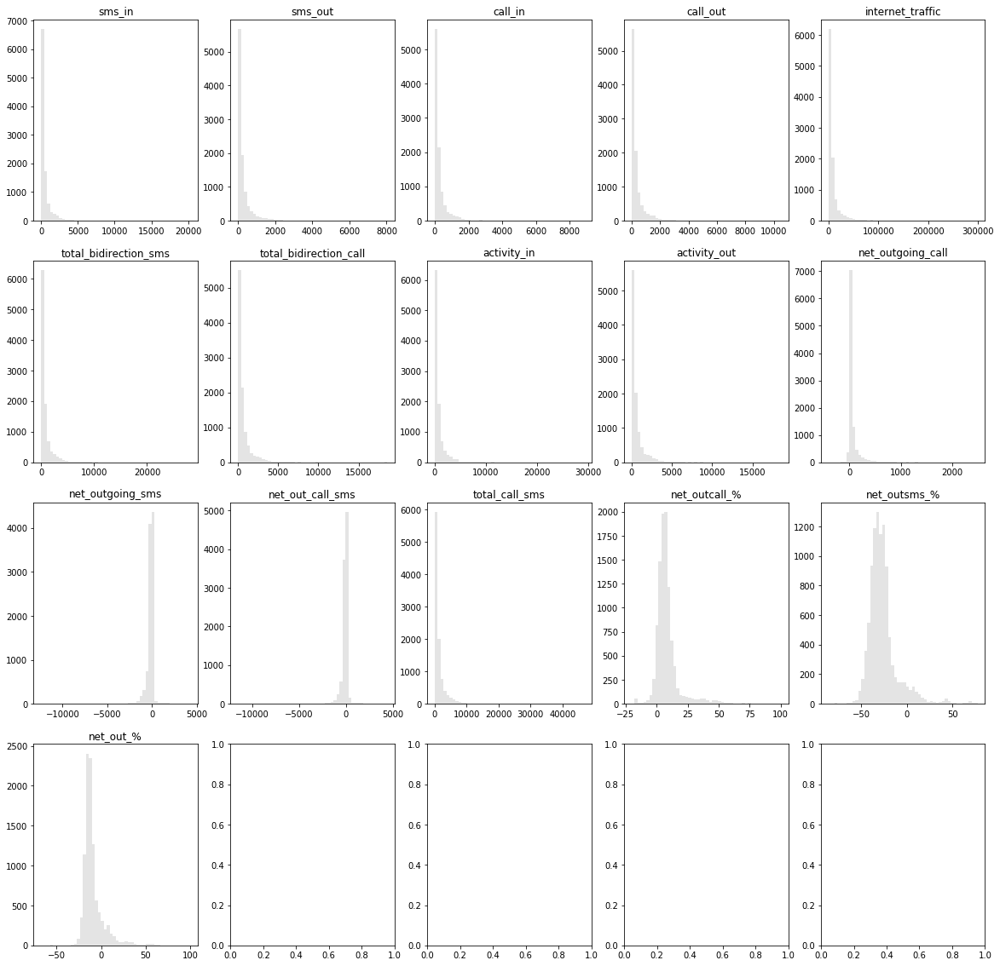

In [33]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))

i = 0
j = 0
for c in col:
    ax[i, j].hist(mi_total_act[c], 50, 
                  facecolor='lightgrey', alpha=0.6)
    ax[i, j].set_title(c)
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1

plt.show()

Again, same as in Mi-Province level most of the data at total level are also highly skewed

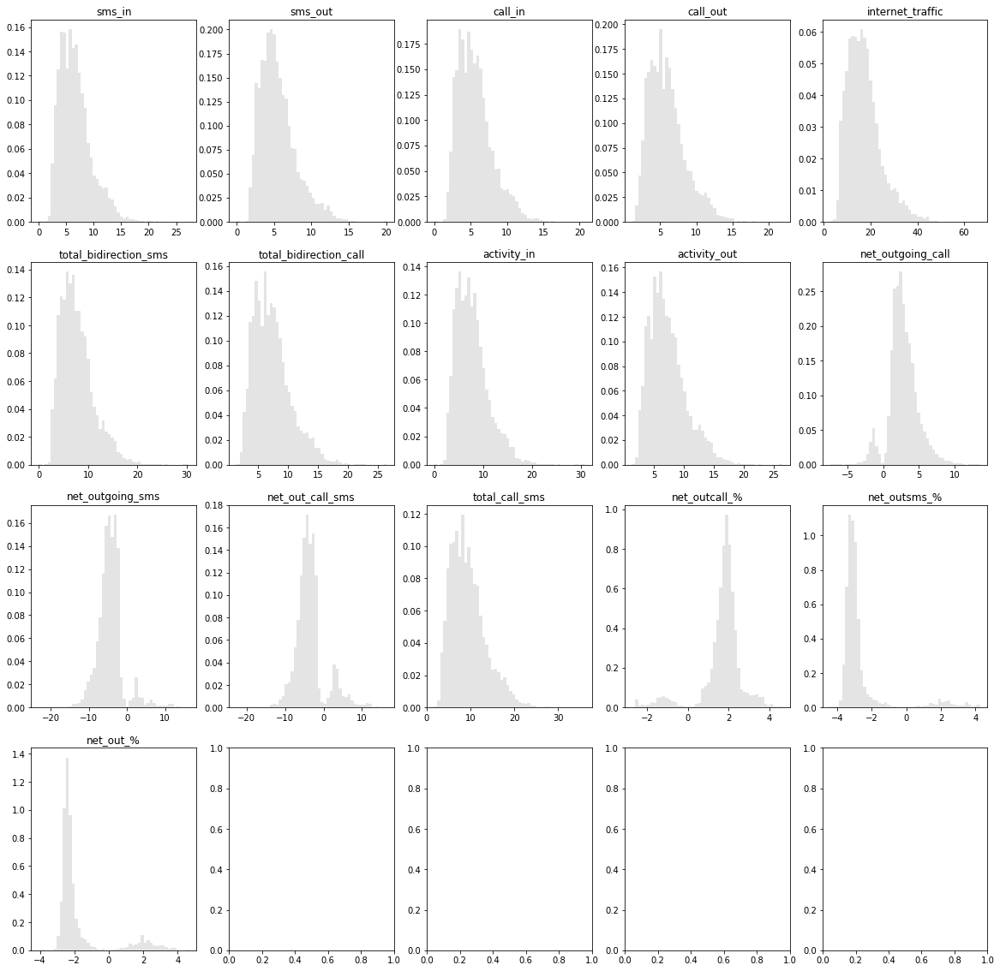

In [34]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))

i = 0
j = 0
for c in col:
    ax[i, j].hist(np.cbrt(mi_total_act[c]), 50, density=True, 
                  facecolor='lightgrey', alpha=0.6)        
    ax[i, j].set_title(c)
#     ax[i, j].set_xscale('log')
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1

plt.show()

Getting to visualize the total activity of all the squares

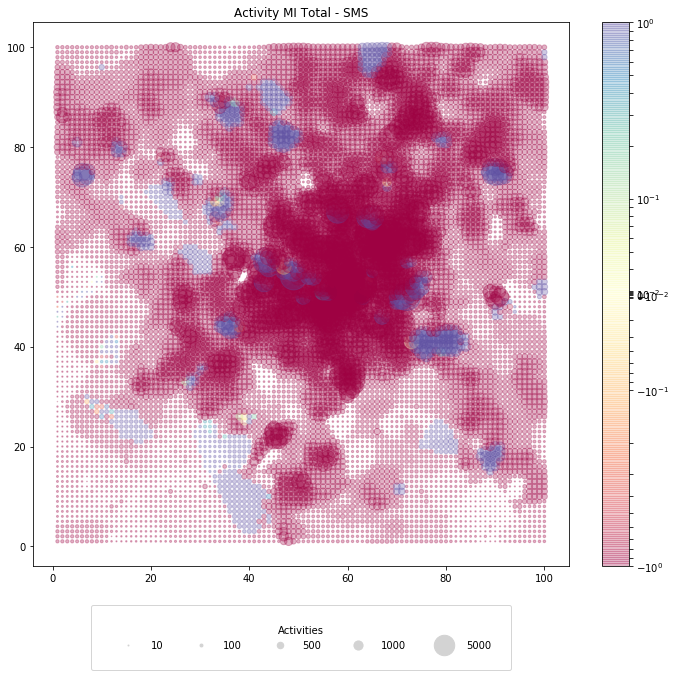

In [35]:
fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_act, 
                 'total_bidirection_sms', 'net_outsms_%', 
                 'Activity MI Total - SMS')
plt.show()

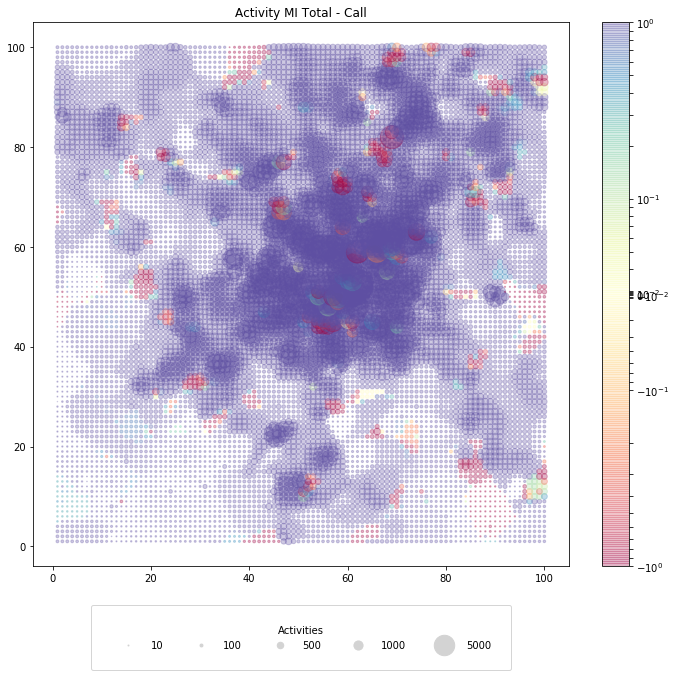

In [36]:
fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_act, 
                 'total_bidirection_call', 'net_outcall_%', 
                 'Activity MI Total - Call')
plt.show()

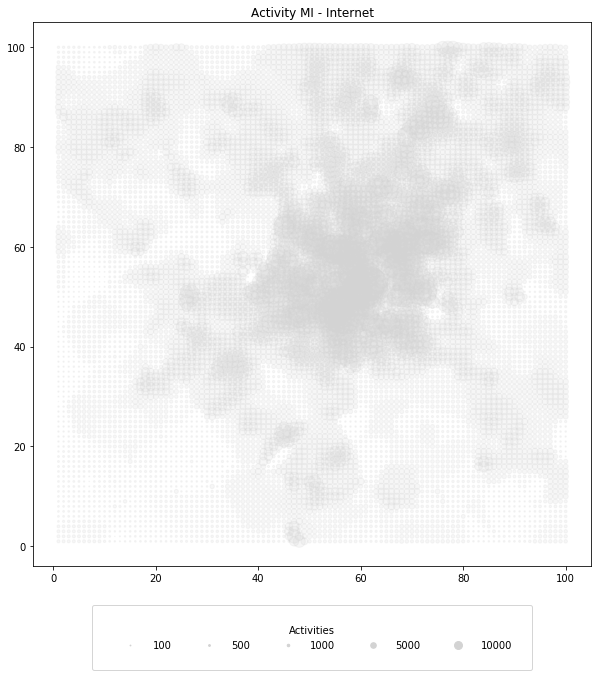

In [37]:
fig, ax = plt.subplots(figsize=(10, 10))
plt.scatter(x=mi_total_act['col'], 
            y=mi_total_act['row'], 
            s=mi_total_act['internet_traffic']/160, 
            c='lightgrey', alpha=0.2)
plt.title('Activity MI - Internet')
legend_label = [100, 500, 1000, 5000, 10000]
legend_box = [plt.scatter([], [], 
                          s=i/160, c='lightgrey') for i in legend_label]
plt.legend(legend_box, legend_label, bbox_to_anchor=(0.5, -0.2), 
           ncol=5, handlelength=3.5, loc=8, borderpad=2, 
           handletextpad=0.5, title='Activities'
          )
plt.show()

There seems to be correlation in activity level between the squares, so check for correlation:

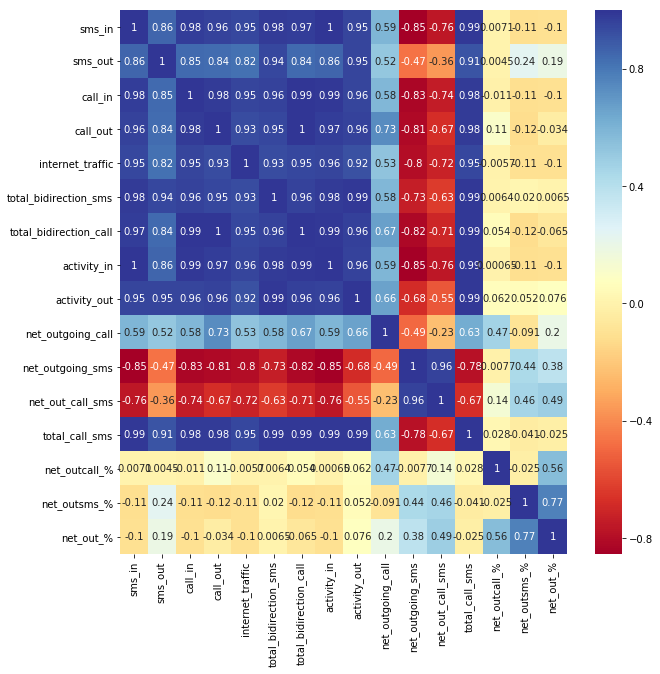

In [38]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(mi_total_act.drop(columns=['row', 'col', 'time_interval', 
                                    'square_id', 'country_code'])
                        .corr(), 
            cmap='RdYlBu', annot=True)
plt.show()

This is correlation between different square id, for example if a square register higher number of call/sms it will also register higher internet traffic.

It is interesting to see that the higher the total call, the more likely that the square will be a net receiver in text. Similarly for internet traffic.

Again, split into quantile and calculating density:

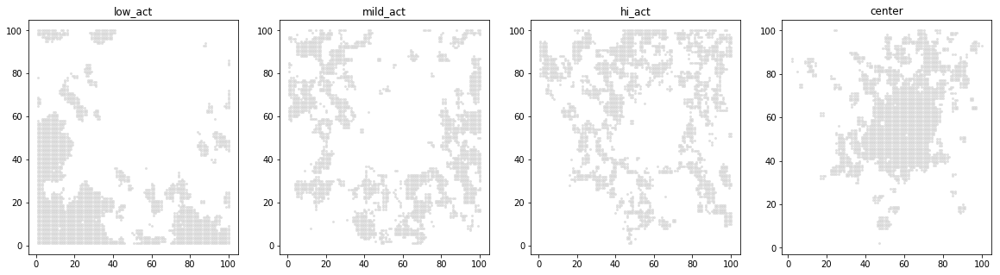

In [39]:
mi_total_act = quant_div(mi_total_act, 'total_call_sms')

mi_total_grp = {}
activity_ids = {}
act_dens = pd.DataFrame()
for lvl in act_lvl_name:
    is_lvl = mi_total_act['act_group'] == lvl
    activity_ids[lvl] = mi_total_act.loc[is_lvl, 'square_id']
    has_act_lvl_ids = mi_file['square_id'].isin(activity_ids[lvl])
    mi_file.loc[has_act_lvl_ids, 'act_group'] = lvl
    
    tessel_area = is_lvl.sum()
    act_dens[lvl] = mi_total_act.loc[is_lvl, col].sum() / tessel_area

act_map, mi_by_act = map_to_square(mi_file, 
                                   ['act_group'], act_lvl_name)


fig, ax = plt.subplots(ncols=4, figsize=(20, 5))
for i, lvl in enumerate(act_lvl_name):
    ax[i].scatter(x=act_map[lvl]['col'], 
                  y=act_map[lvl]['row'], s=4, 
                  c='lightgrey', alpha=0.6)
    ax[i].set_title(lvl)

plt.show()

It appears that the squares can be organized into roughly 4 concentric rings. The center seems to be in (40, 80) x (40, 80)

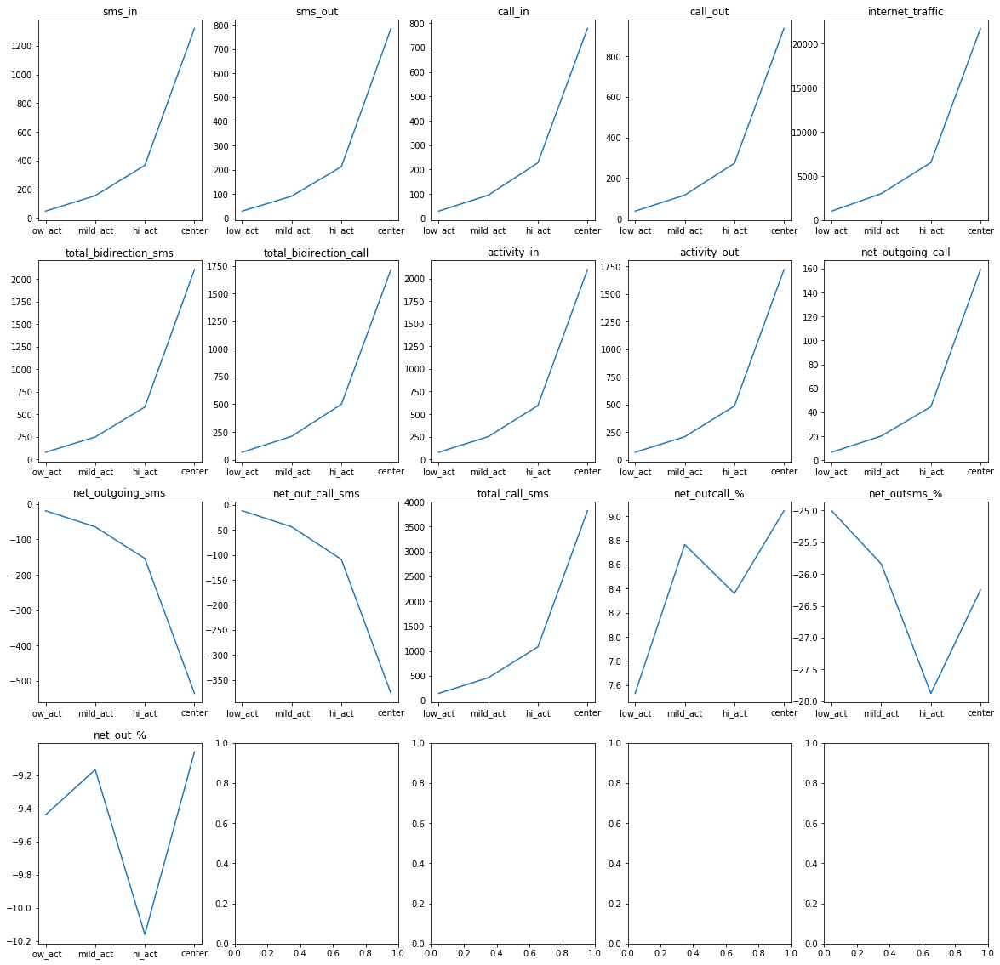

In [40]:
fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))
i = 0
j = 0
for c in col:
    ax[i, j].plot(act_dens.loc[c])
    ax[i, j].set_title(c)
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1
        
plt.show()

The activity in core area ('center') is 3.5 times more dense than the high-activity area, following an exponential process. Zoom into the center:

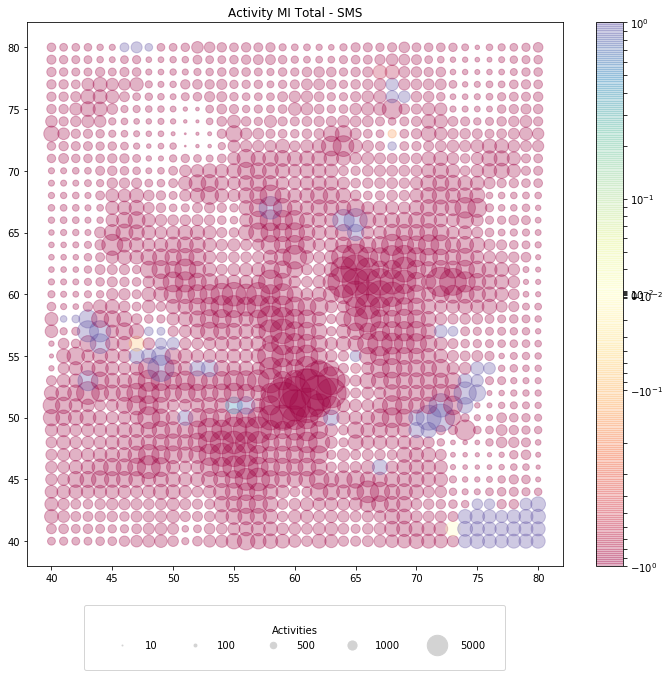

In [41]:
zoom_center = ((mi_total_act['row'] >= 40) 
               & (mi_total_act['row'] <= 80) 
               & (mi_total_act['col'] >= 40) 
               & (mi_total_act['col'] <= 80))
mi_total_zoom = mi_total_act.loc[zoom_center]

fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_zoom, 
                 'total_bidirection_sms', 'net_outsms_%', 
                 'Activity MI Total - SMS')
plt.show()

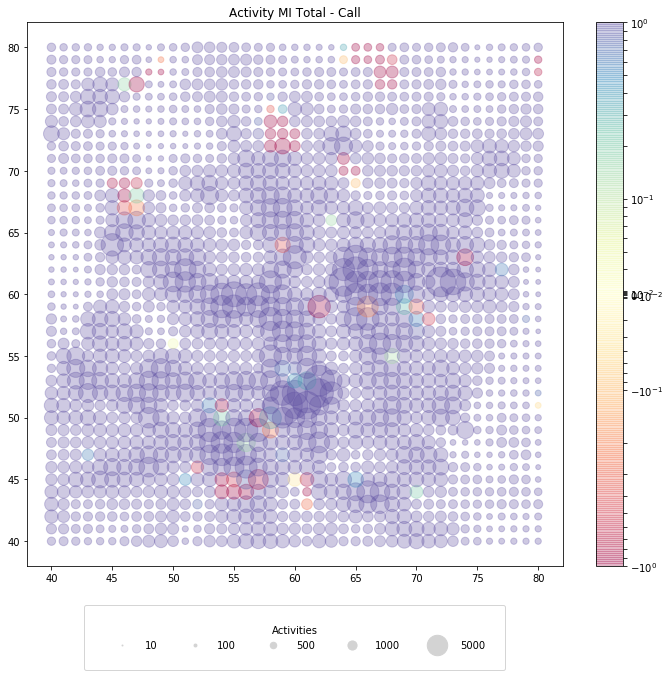

In [42]:
fig, ax = plt.subplots(figsize=(12, 10))
plot_square_coor(mi_total_zoom, 
                 'total_bidirection_call', 'net_outcall_%', 
                 'Activity MI Total - Call')
plt.show()

Even in the center activity concentrates in very small areas, a 'core' area and 3 adjacent, diagonal areas

![](https://upload.wikimedia.org/wikipedia/commons/0/04/Location_map_Italy_Milan.png)

___

## 5. Location & connection

To where do the high activity square call, and from where did they receive call?

In [43]:
# act_id_list = {}
# for grp in act_lvl_name:
#     is_in_grp = mi_total_act['act_group'] == grp
#     activity_ids = mi_total_act.loc[is_in_grp, 'square_id']
#     has_act_grp_ids = mi_file['square_id'].isin(activity_ids)
#     mi_file.loc[has_act_grp_ids, 'act_group'] = grp

for lvl in act_lvl_name:
    print (lvl)
    display (top_contact_prov(activity_ids[lvl], 
                              mi_prov_grp[lvl], 
                              'total_bidirection').head())

low_act


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,651783513,337762126512000000,"20,821.58","20,207.36","41,028.94",614.22
PAVIA,108070302,92907704664000000,"1,258.82","1,446.64","2,705.46",-187.81
MONZA E DELLA BRIANZA,84793806,35464815636000000,445.32,472.91,918.23,-27.60
LODI,36453089,28722126782400000,472.24,394.12,866.36,78.13
VARESE,74870729,26515612258200000,291.50,353.71,645.21,-62.20


mild_act


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,1284166594,365387122327800000,"62,215.98","62,723.84","124,939.82",-507.86
MONZA E DELLA BRIANZA,307659644,71101149359400000,"2,724.65","2,981.32","5,705.96",-256.67
PAVIA,182991478,75050764251000000,"1,882.76","2,392.85","4,275.62",-510.09
BERGAMO,155583520,42280792238400000,"1,077.93","1,230.40","2,308.33",-152.47
VARESE,175120651,40676100468000000,"1,055.29","1,143.02","2,198.32",-87.73


hi_act


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,1677770866,377789223481800000,"145,422.79","146,358.23","291,781.02",-935.44
MONZA E DELLA BRIANZA,642436801,118095257025600000,"12,125.31","12,556.38","24,681.69",-431.07
PAVIA,222142864,65770974004800000,"3,252.33","3,563.63","6,815.96",-311.30
BERGAMO,264693731,57008495316000000,"2,702.93","2,714.30","5,417.23",-11.37
NAPOLI,214682303,49983702595200000,"2,196.75","2,375.40","4,572.15",-178.64


center


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing
province,,,,,,
MILANO,1770658417,404314026481800000,"504,888.16","507,515.15","1,012,403.31","-2,626.99"
MONZA E DELLA BRIANZA,662763003,132171391201800000,"23,528.54","24,549.61","48,078.15","-1,021.06"
PAVIA,298278712,79419608670600000,"10,003.14","11,385.46","21,388.60","-1,382.33"
NAPOLI,294948221,71040488914200000,"10,294.32","9,503.88","19,798.21",790.44
BERGAMO,293628261,64559127033600000,"7,614.64","8,074.93","15,689.56",-460.29


![](https://upload.wikimedia.org/wikipedia/commons/a/a0/Italian_regions_provinces.svg)

There's not much deviation in top 3 (Milan, Pavia, Monza) 

In [44]:
for lvl in act_lvl_name:
    print (lvl)
    display (top_contact_prov(activity_ids[lvl], 
                              mi_prov_grp[lvl], 
                              'net_outgoing').head())

low_act


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
OGLIASTRA,10181,5533674600000,0.00,0.09,0.09,-0.09,-100.00
MEDIO CAMPIDANO,131852,22134605400000,0.00,0.81,0.81,-0.81,-99.95
NUORO,939995,482808136800000,0.34,5.21,5.54,-4.87,-87.86
ORISTANO,426357,246245452800000,0.52,5.44,5.96,-4.92,-82.46
FERMO,1114060,449605414200000,1.30,8.50,9.80,-7.21,-73.55


mild_act


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
MEDIO CAMPIDANO,1033140,338935135200000,1.44,18.60,20.04,-17.15,-85.62
OLBIA-TEMPIO,9086201,3072508813800000,29.08,118.38,147.45,-89.30,-60.56
FROSINONE,8936294,3502761986400000,45.47,111.34,156.82,-65.87,-42.01
ASTI,7102537,2307519792000000,30.20,73.92,104.13,-43.72,-41.99
ORISTANO,1991030,665417607600000,8.66,19.98,28.64,-11.33,-39.54


hi_act


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
ASTI,7052369,1759686274200000,37.86,95.80,133.66,-57.94,-43.35
ALESSANDRIA,22740821,5923721701800000,155.74,327.82,483.56,-172.08,-35.59
BOLOGNA,35606811,7823141250600000,252.76,413.43,666.19,-160.66,-24.12
BARLETTA-ANDRIA-TRANI,21035121,5050798449600000,178.24,287.21,465.45,-108.96,-23.41
MATERA,5346111,1276878496800000,39.12,61.29,100.41,-22.18,-22.09


center


,square_id,time_interval,square_to_prov,prov_to_square,total_bidirection,net_outgoing,net_outgoing_%
province,,,,,,,
ASTI,12539435,3130637844000000,227.82,472.43,700.25,-244.61,-34.93
GORIZIA,5836921,1404155419800000,136.54,226.75,363.29,-90.20,-24.83
ALESSANDRIA,35349876,9173324685600000,858.55,"1,320.91","2,179.46",-462.36,-21.21
CARBONIA-IGLESIAS,5497692,1029249240600000,70.17,104.16,174.32,-33.99,-19.50
PRATO,10699613,2636766696600000,326.82,469.53,796.35,-142.72,-17.92


Interestingly, for top activity provinces most of the outgoing connection is within the North regions. For lower activity provinces outgoing interaction is mostly with Sardinia (the island) and the South

>After World War II, Milan experienced two main waves of immigration: the first, dating from the 1950s to the early 1970s, saw a large influx of migrants from ***poorer and rural areas*** within Italy; the second, starting from the late 1980s, has been characterised by the preponderance of foreign-born immigrants. The early period ... brought to the city a large influx of over 400,000 people, mainly from rural and overpopulated ***Southern Italy***.

The data suggest a concentration of early immigrant community: either old people from the rural provinces or their descendants (who lives in the same areas)

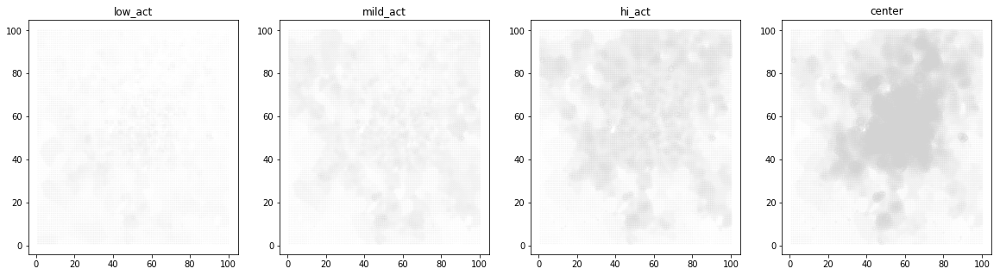

In [92]:
def top_contact_mi(id_list, contact_dir):
    if contact_dir == 'from':
        other_d = 'to_sq_id'
    else:
        other_d = 'from_sq_id'
    d = contact_dir + '_sq_id'
    is_in_list = mi_mi_file[d].isin(id_list)
    result = (mi_mi_file.loc[is_in_list]
                        .groupby(other_d).sum()
                        .sort_values('strength', ascending=False))
    return result

fig, ax = plt.subplots(ncols=4, figsize=(20, 5))
for i, lvl in enumerate(act_lvl_name):
    mi_top_contact = top_contact_mi(activity_ids[lvl], 'from')
    mi_top_contact = mi_top_contact.merge(squares_loc, left_on='to_sq_id', right_on='square_id')
    ax[i].scatter(x=mi_top_contact['col'], 
                  y=mi_top_contact['row'], 
                  s=mi_top_contact['strength'], 
                  c='lightgrey', alpha=0.2)
    ax[i].set_title(lvl)
    
plt.show()

Looking by time priod to see if there's any pattern:

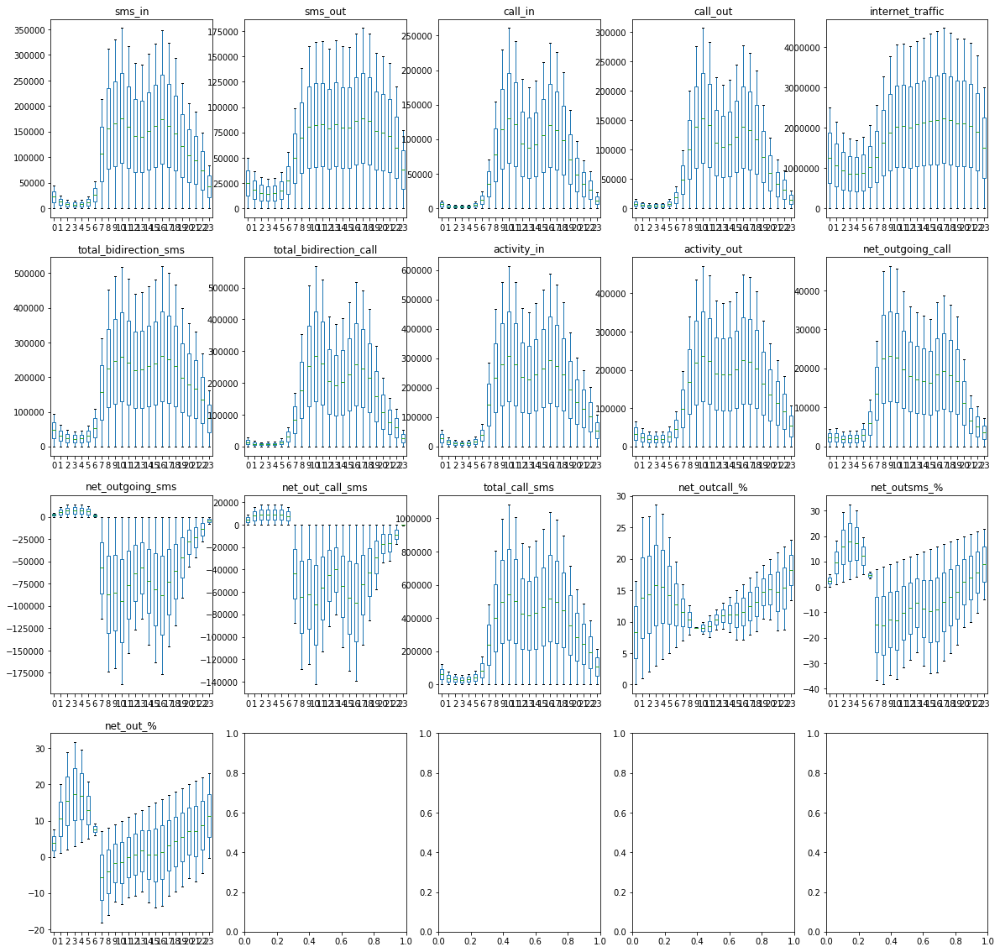

In [45]:
mi_file['time'] = mi_file['datetime'].dt.hour
mi_total_hr = mi_file.groupby('time').sum().reset_index()
mi_total_hr = net_pc_calc(mi_total_hr)

fig, ax = plt.subplots(nrows=4, ncols=5, figsize=(20, 20))

i = 0
j = 0
for c in col:
    time_box = mi_total_hr.loc[:, ('time', c)].T
    time_box.plot(kind='box', title=c, ax=ax[i, j])
    #(kind='bar', facecolor='lightgrey', alpha=0.6, ax=ax[i, j])
    if j == 4:
        i += 1
        j = 0
    else:
        j += 1

plt.show()

There's a clear distiction between work hour/end of work/night time. Next we split the data by time of day to see if there is difference in behaviour that can be used to identify work vs home for residents

In [46]:
is_mnight = (mi_file['time'] >= 24) | (mi_file['time'] < 2)
is_night = (mi_file['time'] >= 2) & (mi_file['time'] < 6)
is_work = (mi_file['time'] >= 6) & (mi_file['time'] < 21)
is_free = (mi_file['time'] >= 21) & (mi_file['time'] < 24)

mi_file.loc[is_mnight, 'time_period'] = 'mnight_hr'
mi_file.loc[is_night, 'time_period'] = 'night_hr'
mi_file.loc[is_work, 'time_period'] = 'work_hr'
mi_file.loc[is_free, 'time_period'] = 'free_hr'

display (mi_file.groupby('time_period').sum())

,square_id,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,time
time_period,,,,,,,,,,,,,,,,,
free_hr,2644376679,706424077454066944,88665077,"422,074.16","340,915.69","147,073.15","177,867.35","10,930,193.94","762,989.85","324,940.50","569,147.31","518,783.04","30,794.19","-81,158.47","-50,364.27","1,087,930.35",11187740
mnight_hr,1146719669,310876895533200000,86839211,"70,344.62","86,191.47","17,886.59","27,066.53","4,649,671.69","156,536.09","44,953.12","88,231.20","113,258.00","9,179.95","15,846.85","25,026.80","201,489.20",105631
night_hr,2260373647,604444688623442432,70888099,"71,581.17","125,330.51","25,347.79","43,183.53","7,096,069.73","196,911.68","68,531.32","96,928.96","168,514.04","17,835.75","53,749.33","71,585.08","265,443.01",1573442
work_hr,18642646398,4942580736111297536,687631567,"4,186,039.82","2,253,445.86","2,645,291.14","3,164,962.91","58,315,081.29","6,439,485.68","5,810,254.04","6,831,330.96","5,418,408.76","519,671.77","-1,932,593.96","-1,412,922.19","12,249,739.72",46860775


As expected, most activity peak during work hour, and slowdown as the day pass. Call use gain the most during work, while in free hour people spend more on Internet activity. We want to compare the activity of each square id in a day as a baseline, then we will try to see if different timing impact overall usage behaviour

In [47]:
period = ['mnight_hr', 'night_hr', 'work_hr', 'free_hr']
hr_map, mi_by_hr = map_to_square(mi_file, ['time_period'], period)

display (mi_by_hr.head())
display (hr_map['mnight_hr'].head())

,square_id,time_period,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,time
0,1,free_hr,51185823000000,894,7.72,5.40,1.96,1.73,193.61,13.12,3.69,9.69,7.13,-0.24,-2.32,-2.56,16.82,814
1,1,mnight_hr,29050423200000,776,2.15,1.39,0.26,0.16,82.88,3.54,0.43,2.42,1.55,-0.10,-0.77,-0.87,3.97,10
2,1,night_hr,45651060000000,1450,1.51,1.42,0.22,0.32,129.38,2.92,0.54,1.72,1.74,0.11,-0.09,0.02,3.46,123
3,1,work_hr,329249083200000,14546,75.03,35.67,45.45,51.38,"1,109.77",110.70,96.82,120.48,87.05,5.93,-39.37,-33.43,207.53,3147
4,2,free_hr,51185823000000,894,7.82,5.48,1.98,1.76,194.40,13.31,3.75,9.81,7.24,-0.22,-2.34,-2.56,17.05,814


,square_id,time_period,time_interval,country_code,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,...,net_outgoing_call,net_outgoing_sms,net_out_call_sms,total_call_sms,time,col,row,net_out_%,net_outcall_%,net_outsms_%
0,1,mnight_hr,29050423200000,776,2.15,1.39,0.26,0.16,82.88,3.54,...,-0.10,-0.77,-0.87,3.97,10,1,1.00,-21.96,-24.59,-21.65
1,2,mnight_hr,29050423200000,776,2.17,1.40,0.27,0.16,83.04,3.57,...,-0.11,-0.77,-0.88,4.01,10,2,1.00,-21.91,-25.02,-21.52
2,3,mnight_hr,27667068600000,776,2.18,1.41,0.28,0.17,83.21,3.60,...,-0.11,-0.77,-0.88,4.05,9,3,1.00,-21.85,-25.45,-21.40
3,4,mnight_hr,29050423200000,776,2.11,1.35,0.24,0.15,82.42,3.47,...,-0.09,-0.76,-0.85,3.86,10,4,1.00,-22.13,-23.19,-22.01
4,5,mnight_hr,29050423200000,776,1.91,1.23,0.22,0.15,74.29,3.15,...,-0.08,-0.68,-0.76,3.51,10,5,1.00,-21.57,-21.15,-21.62


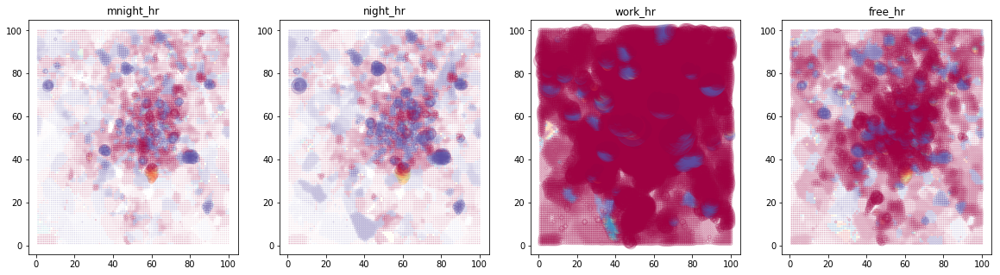

In [48]:
fig, ax = plt.subplots(ncols=len(period), figsize=(20, 5))
plot_map(hr_map, 'total_bidirection_sms', 'net_outsms_%', period)
plt.show()

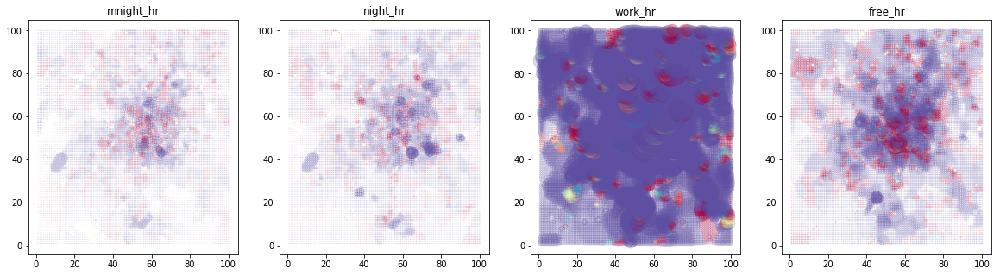

In [49]:
fig, ax = plt.subplots(ncols=len(period), figsize=(20, 5))
plot_map(hr_map, 'total_bidirection_call', 'net_outcall_%', period)
plt.show()

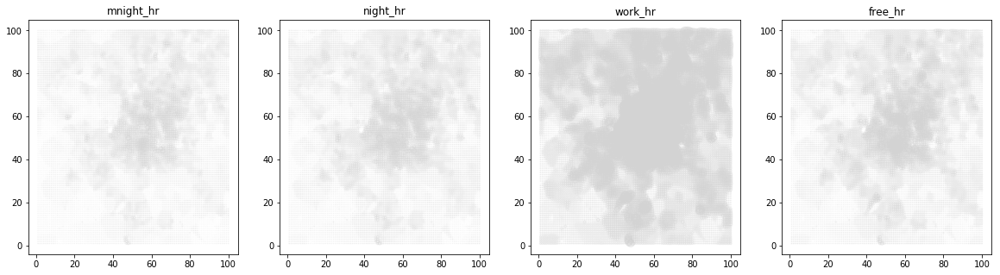

In [50]:
fig, ax = plt.subplots(ncols=len(period), figsize=(20, 5))
plot_map_internet(hr_map, period, 240)
plt.show()

Checking if correlation between variables persist in different time period:

In [93]:
def intensity_and_density(df, cal_col, grp_col):
    """
    Calculate and return the density and intensity of activity
    """
    density = pd.DataFrame()
    intensity = pd.DataFrame()
    drop_list = df.columns.difference(cal_col+grp_col)

    df1 = df.drop(drop_list, axis=1)
    df1[cal_col] = df1[cal_col].astype(bool)
    density = df1.groupby(grp_col).sum()   
    intensity = df.groupby(grp_col).sum() / density
    
    density = density.reset_index().merge(squares_loc, 
                                          on='square_id')
    intensity = intensity.fillna(0).reset_index().merge(squares_loc, 
                                                        on='square_id')
    return density, intensity

In [94]:
cal_list = ['activity_in', 'activity_out', 'call_in', 'call_out', 
            'internet_traffic', 'sms_in', 'sms_out', 
            'total_bidirection_call', 'total_bidirection_sms', 
            'total_call_sms']
dens, inte = intensity_and_density(mi_file, cal_list, ['square_id'])

display (dens.head())
display (inte.head())

,square_id,sms_in,sms_out,call_in,call_out,internet_traffic,total_bidirection_sms,total_bidirection_call,activity_in,activity_out,total_call_sms,col,row
0,1,261.00,146.00,129.00,172.00,162.00,270.00,184.00,269.00,202.00,305.00,1,1.00
1,2,261.00,146.00,129.00,172.00,162.00,270.00,184.00,269.00,202.00,305.00,2,1.00
2,3,253.00,143.00,127.00,162.00,158.00,260.00,175.00,260.00,191.00,289.00,3,1.00
3,4,261.00,146.00,129.00,172.00,162.00,270.00,184.00,269.00,202.00,305.00,4,1.00
4,5,263.00,146.00,131.00,179.00,162.00,271.00,193.00,272.00,206.00,308.00,5,1.00


,square_id,activity_in,activity_out,call_in,call_out,country_code,internet_traffic,net_out_call_sms,net_outgoing_call,net_outgoing_sms,sms_in,sms_out,time,time_interval,total_bidirection_call,total_bidirection_sms,total_call_sms,col,row
0,1,0.50,0.48,0.37,0.31,0.00,9.36,0.00,0.00,0.00,0.33,0.30,0.00,0.00,0.55,0.48,0.76,1,1.00
1,2,0.51,0.49,0.38,0.32,0.00,9.40,0.00,0.00,0.00,0.34,0.30,0.00,0.00,0.56,0.49,0.77,2,1.00
2,3,0.53,0.53,0.39,0.34,0.00,9.69,0.00,0.00,0.00,0.35,0.32,0.00,0.00,0.60,0.52,0.83,3,1.00
3,4,0.48,0.46,0.35,0.30,0.00,9.23,0.00,0.00,0.00,0.32,0.29,0.00,0.00,0.53,0.46,0.73,4,1.00
4,5,0.44,0.42,0.33,0.27,0.00,8.41,0.00,0.00,0.00,0.29,0.27,0.00,0.00,0.47,0.43,0.67,5,1.00


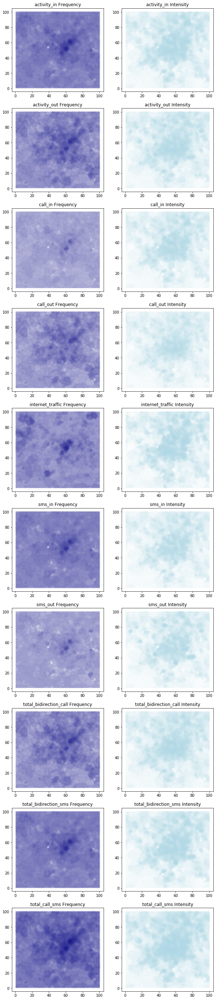

In [96]:
fig, ax = plt.subplots(ncols=2, nrows=len(cal_list), figsize=(10, 50))
for i, v in enumerate(cal_list):
    if v != 'internet_traffic': 
        i_s_adj = 4 
    else: 
        i_s_adj = 1/4
    
    ax[i, 0].scatter(x=dens['col'], y=dens['row'], 
                     s=dens[v]/32, c='navy', alpha=0.2)
    ax[i, 1].scatter(x=inte['col'], y=inte['row'], 
                     s=inte[v]*i_s_adj, c='lightblue', alpha=0.2)
    ax[i, 0].set_title(v+' Frequency')
    ax[i, 1].set_title(v+' Intensity')
    
plt.show()

In [54]:
for p in period:
    hr_map[p].fillna(0, inplace = True)
    
for p in period:
    print (p)
    print (np.corrcoef(hr_map[p]['total_bidirection_call'], 
                       hr_map[p]['total_bidirection_sms']))
    print (np.corrcoef(hr_map[p]['net_outcall_%'], 
                       hr_map[p]['net_outsms_%']))

mnight_hr
[[1.         0.45218446]
 [0.45218446 1.        ]]
[[1.         0.04057394]
 [0.04057394 1.        ]]
night_hr
[[1.         0.23772159]
 [0.23772159 1.        ]]
[[ 1.         -0.04053213]
 [-0.04053213  1.        ]]
work_hr
[[1.         0.96743313]
 [0.96743313 1.        ]]
[[ 1.         -0.04008107]
 [-0.04008107  1.        ]]
free_hr
[[1.        0.9096711]
 [0.9096711 1.       ]]
[[ 1.         -0.00511709]
 [-0.00511709  1.        ]]


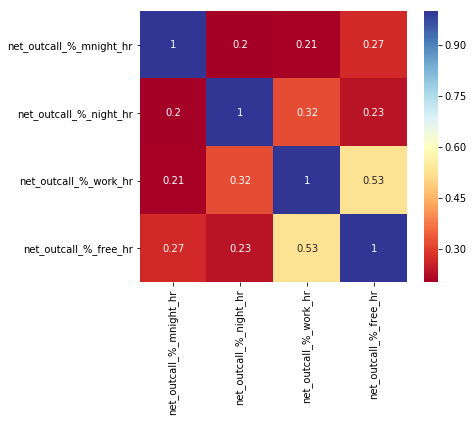

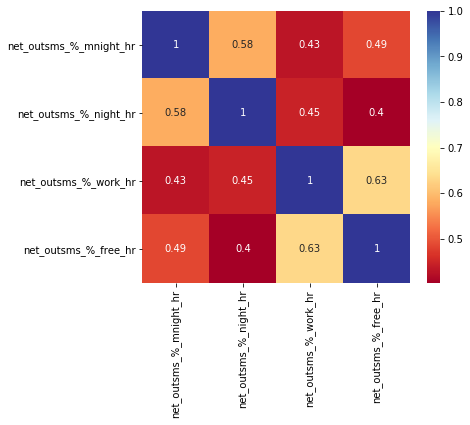

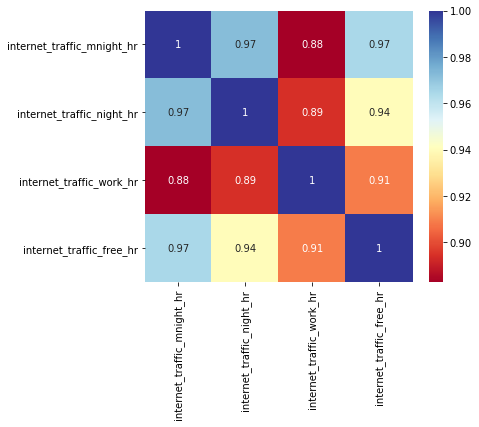

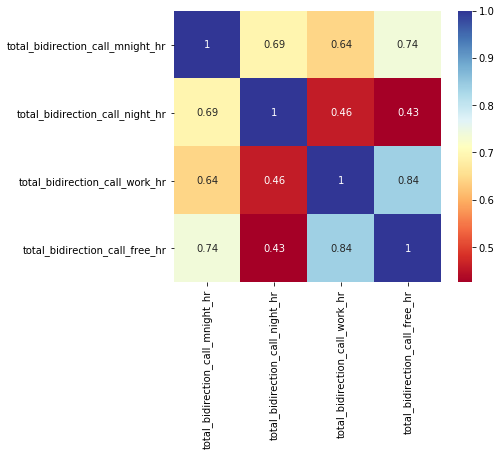

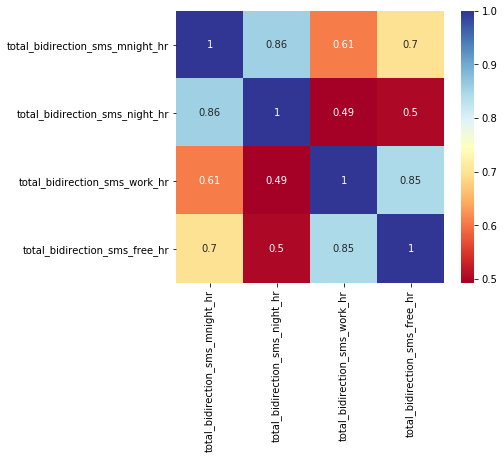

In [55]:
var_set = ['net_outcall_%', 'net_outsms_%', 'internet_traffic', 
           'total_bidirection_call', 'total_bidirection_sms']

for var in var_set:
    name_list = [var + '_' + s for s in period]
    c_sec = pd.concat([hr_map[p][var] for p in period], axis=1)
    c_sec.columns = name_list
    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(c_sec.corr(), cmap='RdYlBu', annot=True)
    plt.show()

This is correlation between different square across time period. We can see that midnight and work is quite separated: a square that have high net % outcall during work is not likely to have high % outcall during midnight, but correlation in activity remain during night and midnight. The reson why correlation are not negative is because we include all square ids. If we can classify the square purpose and calculate the correlation we might get a better picture

/Users/admin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/admin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/Users/admin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value in

mnight_hr


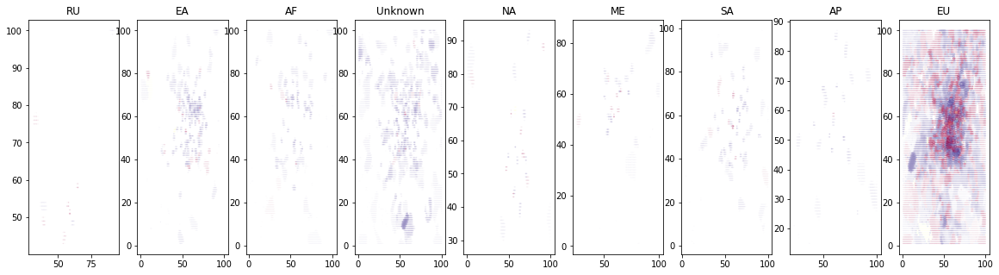

night_hr


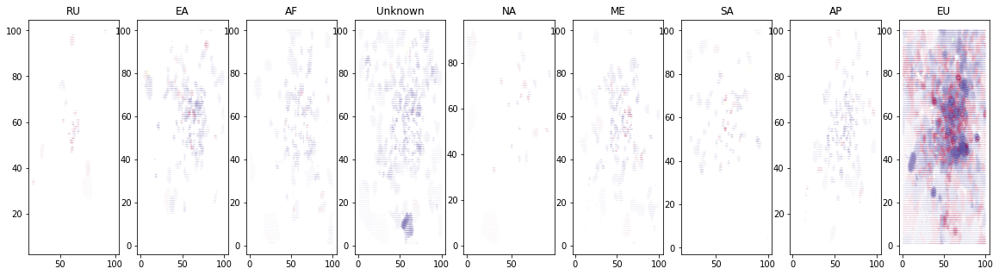

work_hr


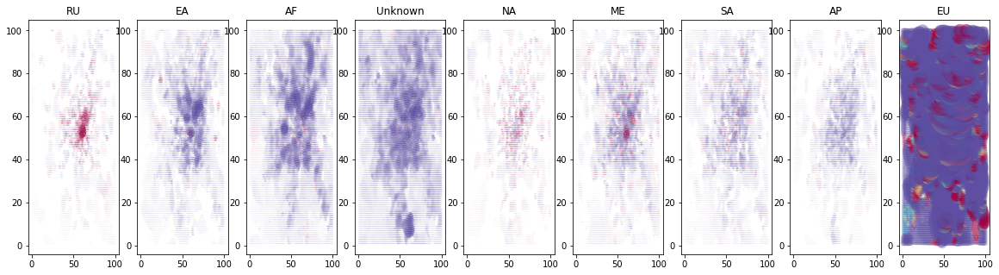

free_hr


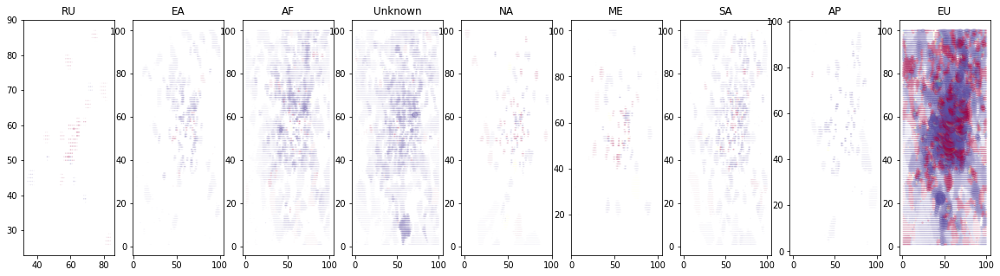

In [57]:
ctr_hr_map, mi_by_ct_hr = map_to_square(mi_file, 
                                        ['time_period', 'country'], period)

for p in period:
    ctr_by_hr, mi_ct_by_hr = map_to_square(ctr_hr_map[p], 
                                           ['country'], country)
    print (p)
    fig, ax = plt.subplots(ncols=len(country_u), figsize=(20, 5))
    plot_map(ctr_by_hr, 'total_bidirection_call', 'net_outcall_%', country_u)
    plt.show()